__собираем статистики по объявлениям о продаже домов__

_Evgeny S. Borisov <parser@mechanoid.su>_

In [1]:
!date

Пт 21 мар 2025 12:12:05 MSK


# загружаем данные

In [2]:
import numpy as np
import pandas as pd
import geopandas as gpd

pd.set_option('display.max_colwidth', None)
pd.set_option('display.float_format', '{:.2f}'.format)

In [3]:
# df = pd.read_pickle('data/2024/df_house.pkl')
df = pd.concat([ 
        # pd.read_pickle('data/2023/df_house.pkl.gz').rename(columns={'adr':'address'}),
        pd.read_pickle('data/2024/df_house.pkl.gz'),
        pd.read_pickle('data/2025/df_house.pkl'), 
    ]).reset_index(drop=True)

df['dt'] = df['ts'].dt.date
display( len(df) )
cols = ['title','address','latitude','longitude','priceM','dt']
display( df.sample(3)[cols] )

100278

,title,address,latitude,longitude,priceM,dt
22484,"дом 170 м² на участке 5,9 сот.","севастополь,эстонская ул.,16",44.599155,33.543201,16.00,2024-06-14
69316,дом 62 м² на участке 4 сот.,"севастополь,садоводческое товарищество интернационалист",44.538966,33.468119,7.00,2024-10-21
66298,дом 900 м² на участке 14 сот.,"севастополь,пл.нахимова",44.616751,33.525594,390.00,2024-08-06


In [4]:
def address_filter(df):
    #           46.319437, 33.911048
    #
    # 45.402617, 32.455625 |  45.545301, 36.684702
    #
    #          44.320887, 33.917013

    df['latitude'] = pd.to_numeric( df['latitude'], errors='coerce' )
    df['longitude'] = pd.to_numeric( df['longitude'], errors='coerce' )

    df = df.query('(32.4<longitude<36.7) & (44.3<latitude<46.4)') 

#     df.loc[ df['address']=='Севастополь,Чёрное море', ['latitude','longitude'] ] = None
#     df.loc[ df['address'].str.lower().str.match('чёрное море'), ['latitude','longitude'] ] = None 

#     df.loc[ df['address']=='квартал Старый Город', 'place'] = 'turkie'
#     df.loc[ df['address'].str.lower().str.match('анталья'), 'place' ] = 'turkie' 

#     df.loc[ df['address'].str.lower().str.match(r'.*бахчисарай.*'), 'place' ] = 'bahchisaray'
#     df.loc[ df['address'].str.lower().str.match(r'.*севастополь,.*'), 'place' ] = 'sevastopol'

#     df.loc[ df['address'].str.lower().str.match(r'.*мысовское.*'), 'place' ] = 'kerch'
    df.loc[ df['address'].str.lower().str.match(r'.*алушта.*'), 'place' ] = 'alushta'
    df.loc[ df['address'].str.lower().str.match(r'.*гурзуф.*'), 'place' ] = 'gurzuf'

#     df.loc[ df['address'].str.lower().str.match(r'.*с.лучистое.*'), 'place' ] = 'alushta'
#     df.loc[ df['address'].str.lower().str.match(r'.*снт солнечная долина.*'), 'place' ] = 'sudak'
#     df.loc[ df['address'].str.lower().str.match(r'.*пгт.новоозёрное.*'), 'place' ] = 'evpatoria'

#     df.loc[ df['address'].str.lower().str.match(r'.*с.мирное.*'), 'place' ] = 'simferopol'
#     df.loc[ df['address'].str.lower().str.match(r'.*тсн аэрофлот.*'), 'place' ] = 'simferopol'

#     df.loc[ df['address'].str.lower().str.match(r'.*семисот.*'), 'place' ] = 'kerch'

#     df.loc[ df['address'].str.lower().str.match(r'.*заветное.*') , 'place' ] = 'kerch'
    df.loc[ df['address'].str.lower().str.match(r'.*ленинский район.*') , 'place' ] = 'kerch'
    df.loc[ df['address'].str.lower().str.match(r'.*симферопольский район.*'), 'place' ] = 'simferopol'
    df.loc[ df['address'].str.lower().str.match(r'.*белогорский район.*'),'place'] = 'belogorsk'
    df.loc[ df['address'].str.lower().str.match(r'.*кировский район.*'),'place'] = 'kirovsky'
    
    df.loc[ df['address'].str.lower().str.match(r'.*ялта.*') , 'place' ] = 'yalta'
    df.loc[ df['address'].str.lower().str.match(r'.*феодосия.*') , 'place' ] = 'feodosia'
    df.loc[ df['address'].str.lower().str.match(r'.*окуневка.*') , 'place' ] = 'tarkhankut'
    df.loc[ df['address'].str.lower().str.match(r'.*евпатория.*') , 'place' ] = 'evpatoria'

    df = df.dropna(subset=['latitude','longitude'])
    
    return df

In [5]:
display( len(df) )
df = address_filter(df)
display( len(df) )

100278

100270

---

In [6]:
# df_ = pd.read_pickle('data/2023/data_house.pkl').rename(columns={'adr':'address'})
# df_['dt'] = df_['ts'].dt.date
# display( len(df_) )
# display( df_.sample(3)[cols] )

In [7]:
# df_ = (
#         df_
#         .dropna(subset=['dt','url'])
#         .drop_duplicates(['dt','url'])
#         .drop(columns=['adr_orig','obj_name','avito_page'])
#     )
# display( len(df_) )
# cols = ['title','address','latitude','longitude','priceM','dt','url']
# display( df_.sample(3)[cols] )

In [8]:
# # history_date = df_['dt'].max()
# history_date = pd.to_datetime('2023-01-10').date()
# display(history_date)

In [9]:
# df = pd.concat([df,df_]).reset_index(drop=True)
# display( len(df) )
# del df_

---

In [10]:
df['month'] = df['ts'].dt.to_period('M')
df['week'] = df['ts'].dt.to_period('W')

In [11]:
display( len(df) )
df = df.drop_duplicates(subset=['week','url']).reset_index(drop=True)
display( len(df) )

100270

85789

---

In [12]:
# display( len(df) )
# df = df.dropna(subset=['latitude','longitude'])
# display( len(df) )

In [13]:
# # только ЦИАН
# display( len(df) )
# df = df[ df['url'].str.match('.*cian.*') ].reset_index(drop=True)
# display( len(df) )

In [14]:
display(len(df))
# выкидываем "ущербные" варианты 
df = df.query('~(is_part) & (house_area>40.) & (priceM<15.)')
display(len(df))
df = df.query('priceM>1.') # выкидываем предожения с аномально низкой ценой
display(len(df))

85789

58342

58253

In [15]:
gdf = gpd.GeoDataFrame( df, geometry = gpd.points_from_xy( df['longitude'], df['latitude']), crs='epsg:4326', )
# [['title','address','latitude','longitude','priceM']] 
display( gdf.sample(3)[cols])

,title,address,latitude,longitude,priceM,dt
19544,"дом 70,6 м² на участке 4 сот.","севастополь,ст милосердие,242",44.51,33.49,10.00,2024-12-10
22278,"дом 60 м² на участке 4,5 сот.","севастополь,железнодорожная ул.,10",44.61,33.54,7.90,2024-11-07
12103,"дом, 102 м², 4.7 сот., садоводство","севастополь,р-н гагаринский,мкр.фиолент,ст источник снт,53",44.55,33.45,7.50,2024-06-07


---

In [16]:
dt_max = df['dt'].max()
dt_min = df['dt'].min()
print( dt_min, ' : ',dt_max )
# display( dt_min,history_date,dt_max )

2024-06-07  :  2025-03-21


In [17]:
display( len(gdf) )
gdf = (
    gdf
    .query("place in ('sevastopol','sudak','bahchisaray')")
    # .drop_duplicates(['dt','url'])
    .drop_duplicates(['url','week'])
    .reset_index(drop=True)
)
display( len(gdf) )

58253

58057

In [18]:
# df[ df['address'].str.match('ялта') ]

In [19]:
# gdf = gdf.query('place in ("bahchisaray","sudak","sevastopol")')

In [20]:
# gdf_history = gdf.query(f'dt <= @history_date')
# gdf = gdf.query(f'dt > @history_date')

In [21]:
# display( len(gdf_history) )
# display( len(gdf) )

---

In [22]:
# cols = ['title','address','latitude','longitude','priceM','dt','place','url']
# gdf[ (gdf['place']=='sevastopol') & (gdf['address'].str.match(r'.*Судак.*')) ][cols]

In [23]:
# gdf['place'].unique()

# общая статистика

In [24]:
# gdf[['title','address','priceM','geometry']].sample(512).explore()

In [25]:
gdf.query('place=="sevastopol"')[['title','address','priceM','geometry']].sample(512).explore()

In [26]:
# gdf[ gdf['address'].str.match(r'.*ялта.*') ]
# gdf[ gdf['address'].str.match(r'.*окуневка.*') ]
# gdf[ gdf['address'].str.match(r'.*заветное.*') ]

In [27]:
gdf.query('place=="bahchisaray"')[['title','address','priceM','geometry']].explore()

In [28]:
gdf.query('place=="sudak"')[['title','address','priceM','geometry']].explore()

In [29]:
percentiles=[.01,.05,.1,.25,.5,.75,.9,.95]
stat = (
        #gdf.groupby(['place','house_size_category','month'],observed=True)
        gdf.groupby(['place','house_size_category','week'],observed=True)
    
        ['priceM'].describe(percentiles=percentiles)
    )

# display( stat )

In [30]:
stat.reset_index()['house_size_category'].unique()

['30-50', '50-70', '70-110', '110-180', '180-300', '300+']
Categories (6, object): ['30-50' < '50-70' < '70-110' < '110-180' < '180-300' < '300+']

In [31]:
import matplotlib.pyplot as plt

cols = ['1%','10%','25%','50%','75%']
# sizes = stat.reset_index()['house_size_category'].unique()
sizes = ['50-70', '70-110','110-180', '180-300' ]
# sizes = ['50-70', '70-150','150-300' ]
display(sizes)

['50-70', '70-110', '110-180', '180-300']

In [32]:
# display(len(gdf))
# gdf_ = gdf[ gdf['house_size_category'].isin(sizes) ].reset_index()
# display(len(gdf_))
# gdf_[['title','house_size_category']]

In [33]:
# dt_now = pd.to_datetime('2024-06-17').date()
# dt_now = gdf['dt'].max()

In [34]:
# (
# gdf
# .query('house_size_category in @sizes')
# .drop_duplicates(['url'])
# .groupby(['house_size_category','place'],observed=True)['url'].count()
# .reset_index()
# .pivot(index='place', columns='house_size_category', values='url')
# .plot.barh(title='количество предложений') #,log=True)
# .grid(axis='x')    
# )

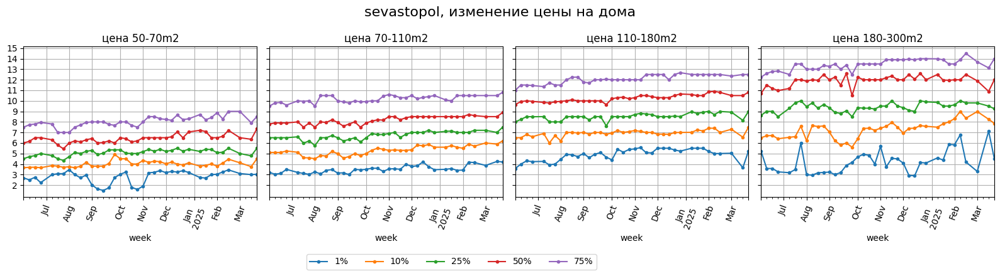

In [35]:
place = 'sevastopol'

# fig, ax = plt.subplots(len(sizes),1,figsize=(11,4*len(sizes)), sharey=True )
fig, ax = plt.subplots(1,len(sizes),figsize=(16,len(sizes)), sharey=True )
for i,s in enumerate(sizes): 
    stat.loc[(place,s),cols].plot(title=f'цена {s}m2', grid=True,ax=ax[i],legend=False, rot=70, style='.-' )   
    ax[i].set_yticks( np.arange(2, 16, step=1) )

fig.suptitle(f'{place}, изменение цены на дома', fontsize=16)
fig.legend( labels=cols,frameon=True, ncol=len(cols), bbox_to_anchor=(0.6, 0.01))    
fig.tight_layout()

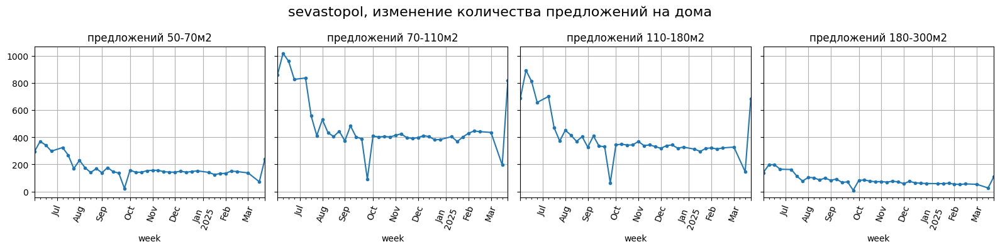

In [36]:
fig, ax = plt.subplots(1,len(sizes),figsize=(16,4), sharey=True )

for i,s in enumerate(sizes): 
    stat.loc[(place,s),'count'].plot(title=f'предложений {s}м2', grid=True,ax=ax[i],legend=False, rot=70, style='.-' )   

fig.suptitle(f'{place}, изменение количества предложений на дома', fontsize=16)
fig.tight_layout()

---

In [37]:
place = 'sudak'

In [38]:
stat.loc[place][['count']].describe(percentiles).T

,count,mean,std,min,1%,5%,10%,25%,50%,75%,90%,95%,max
count,226.00,17.35,16.03,1.00,1.00,2.00,3.50,6.00,12.00,21.00,44.50,50.75,80.00


In [39]:
display( len(stat.loc[place]) )
stat_ = stat.loc[place].query('count>10')
display( len(stat_) )

226

123

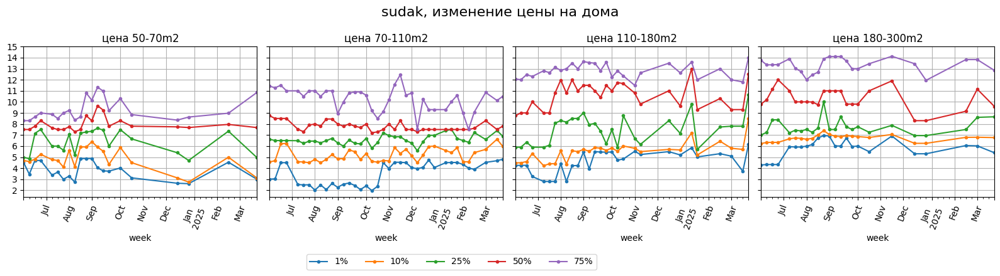

In [40]:
# fig, ax = plt.subplots(len(sizes),1,figsize=(11,4*len(sizes)), sharey=True )
fig, ax = plt.subplots(1,len(sizes),figsize=(16,len(sizes)), sharey=True )

for i,s in enumerate(sizes): 
    # stat.loc[(place,s),cols].plot(title=f'цена {s}m2', grid=True,ax=ax[i],legend=False, rot=70, style='.-' )  
    stat_.loc[s,cols].plot(title=f'цена {s}m2', grid=True,ax=ax[i],legend=False, rot=70, style='.-' )  
    ax[i].set_yticks( np.arange(2, 16, step=1) )

fig.suptitle(f'{place}, изменение цены на дома', fontsize=16)
fig.legend( labels=cols,frameon=True, ncol=len(cols), bbox_to_anchor=(0.6, 0.01))    
fig.tight_layout()

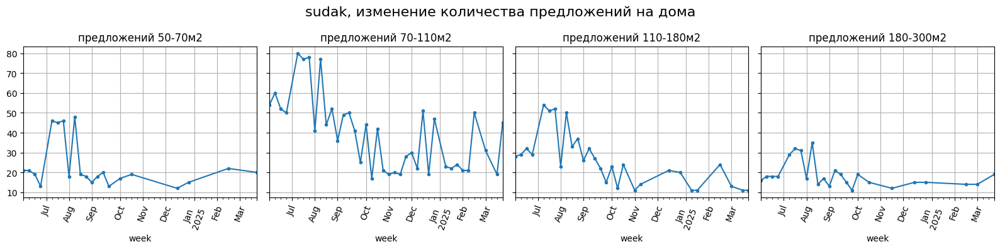

In [41]:
fig, ax = plt.subplots(1,len(sizes),figsize=(16,4), sharey=True )

for i,s in enumerate(sizes): 
    stat_.loc[s,'count'].plot(title=f'предложений {s}м2', grid=True,ax=ax[i],legend=False, rot=70, style='.-' )   
    #stat.loc[(place,s),'count'].plot(title=f'предложений {s}м2', grid=True,ax=ax[i],legend=False, rot=70, style='.-')

fig.suptitle(f'{place}, изменение количества предложений на дома', fontsize=16)
fig.tight_layout()

---

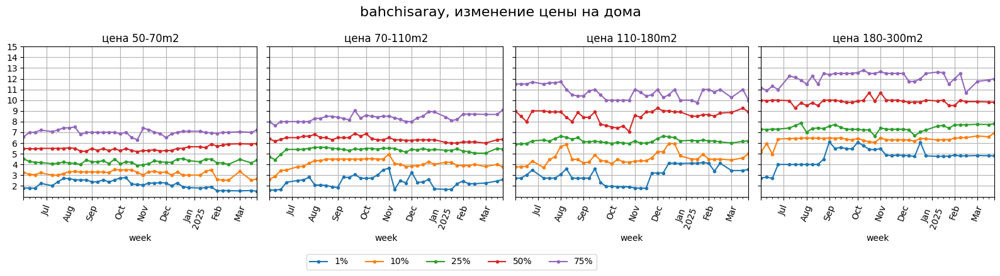

In [42]:
place = 'bahchisaray'

# fig, ax = plt.subplots(len(sizes),1,figsize=(11,4*len(sizes)), sharey=True )
fig, ax = plt.subplots(1,len(sizes),figsize=(16,len(sizes)), sharey=True )

for i,s in enumerate(sizes): 
    stat.loc[(place,s),cols].plot(title=f'цена {s}m2', grid=True,ax=ax[i],legend=False, rot=70, style='.-' )   
    ax[i].set_yticks( np.arange(2, 16, step=1) )

fig.suptitle(f'{place}, изменение цены на дома', fontsize=16)
fig.legend( labels=cols,frameon=True, ncol=len(cols), bbox_to_anchor=(0.6, 0.01))    
fig.tight_layout()

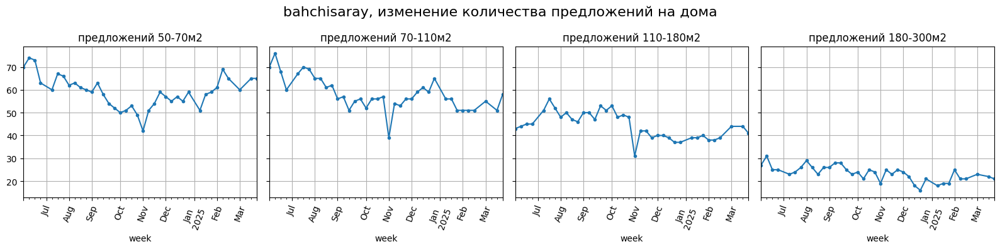

In [43]:
fig, ax = plt.subplots(1,len(sizes),figsize=(16,4), sharey=True )

for i,s in enumerate(sizes): 
    stat.loc[(place,s),'count'].plot(title=f'предложений {s}м2', grid=True,ax=ax[i],legend=False, rot=70, style='.-' )   

fig.suptitle(f'{place}, изменение количества предложений на дома', fontsize=16)
fig.tight_layout()

# актуальная цена

In [44]:
# dt_now = pd.to_datetime('2024-06-17').date()
dt_now = gdf['dt'].max()
display(len(gdf))
gdf_last = gdf[ gdf['dt'] == dt_now ]
display(len(gdf_last))

58057

2271

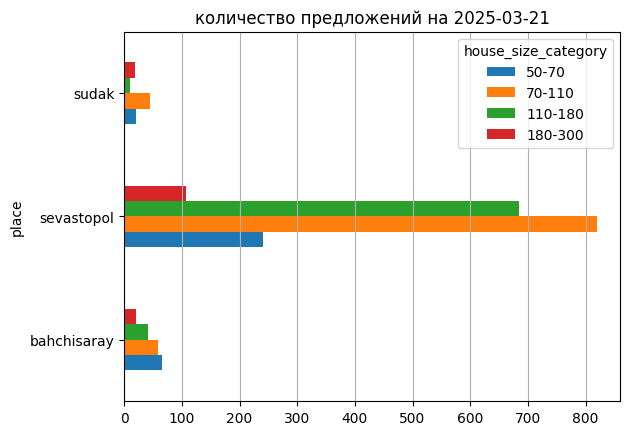

In [45]:
(
gdf_last
.query('house_size_category in @sizes')
.drop_duplicates(['url'])
.groupby(['house_size_category','place'],observed=True)['url'].count()
.reset_index()
.pivot(index='place', columns='house_size_category', values='url')
# .plot.barh(title='количество предложений') #,log=True)
.plot.barh(title='количество предложений на '+ str( dt_now ))
.grid(axis='x')    
)

In [46]:
(
    gdf_last
    .groupby(['place','house_size_category'],observed=False)
    ['priceM'].describe(percentiles=percentiles)
)

count  mean  std   min    1%    5%   10%  \
place       house_size_category                                             
bahchisaray 30-50                28.00  4.07 1.59  1.75  1.76  1.80  1.94   
            50-70                65.00  5.74 2.16  1.15  1.50  2.00  2.65   
            70-110               58.00  7.06 2.80  1.40  2.60  3.61  3.77   
            110-180              41.00  8.66 3.04  3.25  3.55  4.30  5.00   
            180-300              21.00  9.68 2.53  4.50  4.80  6.00  6.95   
            300+                  4.00 12.50 1.91 10.00 10.06 10.30 10.60   
sevastopol  30-50                90.00  6.20 2.39  2.45  3.07  3.49  4.00   
            50-70               240.00  7.32 2.33  2.70  3.03  3.90  4.50   
            70-110              819.00  9.15 2.34  2.75  4.20  5.50  6.20   
            110-180             684.00 10.67 2.31  1.80  5.25  6.73  7.50   
            180-300             107.00 11.35 2.83  2.00  4.50  7.00  7.86   
            300+                  3.00 10.57 5.84  3.90  4.08  4.81  5.72   
sudak       30-50                12.00  8.05 3.91  2.60  2.83  3.76  4.73   
            50-70                20.00  7.93 3.71  2.97  3.00  3.11  3.12   
            70-110               45.00  8.54 2.41  4.50  4.81  5.70  5.98   
            110-180              11.00 11.79 2.73  5.90  6.16  7.20  8.50   
            180-300              19.00 10.48 2.93  5.30  5.40  5.79  6.77   
            300+                  4.00  9.22 2.38  7.00  7.01  7.08  7.15   

                                  25%   50%   75%   90%   95%   max  
place       house_size_category                                      
bahchisaray 30-50                2.48  4.05  5.25  6.26  6.33  6.50  
            50-70                4.40  5.95  7.20  8.00  9.47 10.95  
            70-110               5.43  6.35  9.07 10.16 12.90 14.50  
            110-180              6.20  8.90 10.00 12.30 14.00 14.97  
            180-300              7.80  9.80 12.00 13.00 13.00 13.40  
            300+                11.50 13.00 14.00 14.00 14.00 14.00  
sevastopol  30-50                4.52  5.70  7.00  9.03 10.99 14.30  
            50-70                5.50  7.35  8.50 10.50 11.70 14.80  
            70-110               7.50  8.90 10.80 12.40 13.04 14.99  
            110-180              9.00 10.82 12.50 13.70 14.50 15.00  
            180-300              9.25 12.00 14.00 14.50 14.80 14.90  
            300+                 8.45 13.00 13.90 14.44 14.62 14.80  
sudak       30-50                5.11  6.50 10.98 13.45 13.68 13.90  
            50-70                4.96  7.67 10.85 13.23 13.52 13.90  
            70-110               6.90  7.80 10.50 12.62 12.97 13.50  
            110-180             10.65 12.50 14.00 14.00 14.00 14.00  
            180-300              8.65  9.59 12.85 14.10 14.53 14.80  
            300+                 7.38  8.95 10.80 11.52 11.76 12.00

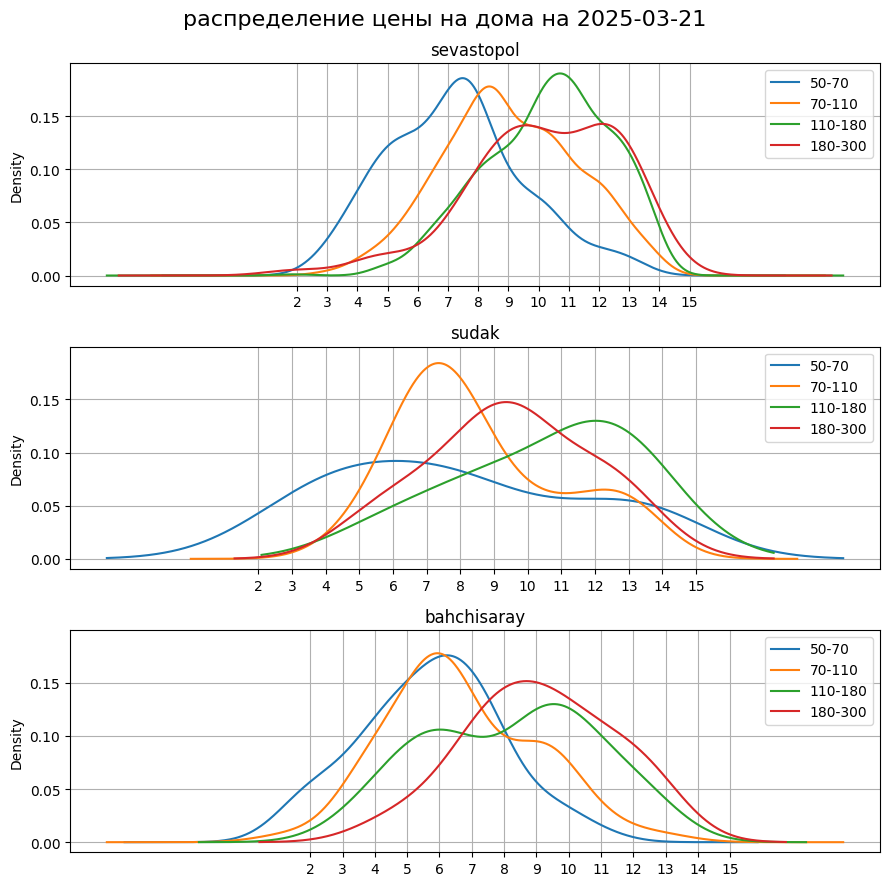

In [47]:
q_95 = gdf_last.groupby(['place'])['priceM'].quantile(.95)

places = ['sevastopol','sudak','bahchisaray']

fig, ax = plt.subplots(len(places),1,figsize=(9,9), sharey=True )
for i,p in enumerate(places): 
    (
        gdf_last
        .query(f' (place=="{p}") & (priceM<{q_95[p]}) & (house_size_category in {sizes})')
        .groupby(['house_size_category'],observed=True)
        ['priceM']
        .plot.kde(legend=True,ax=ax[i],title=f'{p}', grid=True)   
    )
    ax[i].set_xticks( np.arange(2, 16, step=1) )

fig.suptitle(f'распределение цены на дома на '+ str( dt_now ), fontsize=16)
fig.tight_layout()

In [48]:
# (
# gdf_last
# .query(f' (place=="{p}") & (priceM<{q_95[p]}) & (house_size_category in {sizes})')
# .groupby(['house_size_category'],observed=True)
# ['priceM'].plot.kde()
# )

# цены на карте

In [49]:
import h3
from shapely.geometry import Polygon
from shapely.geometry import MultiPoint

In [50]:
# def cover_grid_hexagonal(gmtr,cell_size=6,crs='EPSG:4326'):
#     polygonise = lambda hex_id: Polygon( h3.h3_to_geo_boundary( hex_id, geo_json=True)  )
#     hexs = list(h3.polyfill( gmtr.__geo_interface__, cell_size, geo_json_conformant = True ))
#     return gpd.GeoDataFrame({ 'hex_id': hexs,  'geometry': list(map(polygonise, hexs)), },crs=crs,)

In [51]:
# cols = ['title','address','latitude','longitude','priceM','dt','url']
# gdf_last.query('place=="sevastopol"')[cols]

In [52]:
# gdf_last[gdf_last['place']=='sevastopol'][cols]

## Севастополь

In [53]:
# frame_sevastopol = gpd.GeoDataFrame([{ # все предложения
#             'place':'sevastopol', 
#             'geometry':MultiPoint( gdf_last.query('place=="sevastopol"')['geometry'].tolist() ).convex_hull, 
#         }],crs='EPSG:4326')

# frame_sevastopol.explore()

In [54]:
# grid = cover_grid_hexagonal( frame_sevastopol.geometry.values[0],cell_size=7 )
# grid_values = ( 
#     grid
#     .sjoin( gdf_last.query('place=="sevastopol"'), how='inner',)
#     .groupby(['hex_id'])
#     ['priceM']
#     .median()
#     .reset_index()
# )
# grid.merge(grid_values,on='hex_id').explore('priceM',cmap='rainbow') #'area_name', legend=True)

## Судак

In [55]:
# frame_sudak = gpd.GeoDataFrame([{ # все предложения
#             'place':'sudak', 
#             'geometry':MultiPoint( gdf_last.query('place=="sudak"')['geometry'].tolist() ).convex_hull, 
#         }],crs='EPSG:4326')

# # frame_sudak.explore()

In [56]:
# grid = cover_grid_hexagonal( frame_sudak.geometry.values[0],cell_size=8 )
# grid_values = ( 
#     grid
#     .sjoin( gdf_last.query('place=="sudak"'), how='inner',)
#     .groupby(['hex_id'])
#     ['priceM']
#     .median()
#     .reset_index()
# )
# grid.merge(grid_values,on='hex_id').explore('priceM',cmap='rainbow') #'area_name', legend=True)

# районы Севастополя

In [57]:
# загружаем области поиска
frames_path = 'data/frames/'
frames_index = pd.read_csv(f'{frames_path}/_index.tsv',sep='\t')

swap_coo = lambda coo : [ (c[1],c[0]) for c in coo ]
df2poly = lambda df : Polygon(swap_coo(df.values))

frames = gpd.GeoDataFrame([ 
        { 'area_name':nm, 'geometry': df2poly( pd.read_csv(f'{frames_path}/{f}',header=None) ) } 
        for nm,f in frames_index.values
    ],crs='epsg:4326',)

In [58]:
display(frames)

,area_name,geometry
0,"Севастополь, район Острякова","POLYGON ((33.51618 44.58832, 33.52597 44.58817, 33.53399 44.57315, 33.54248 44.55177, 33.52583 44.55023, 33.51174 44.57861, 33.51253 44.58565, 33.51253 44.58565, 33.51618 44.58832))"
1,"Севастополь, парк 60-летия СССР","POLYGON ((33.51805 44.58404, 33.51458 44.58408, 33.51263 44.58032, 33.51435 44.5746, 33.52004 44.5752, 33.51805 44.58404))"
2,"Севастополь, Хрусталёва/Хрюкина","POLYGON ((33.52003 44.5751, 33.52527 44.56364, 33.52116 44.56136, 33.51942 44.56406, 33.51951 44.56384, 33.51874 44.56882, 33.51426 44.57444, 33.52003 44.5751))"
3,"Севастополь, Геловани/Коломийца","POLYGON ((33.52139 44.57296, 33.53034 44.57518, 33.53318 44.57414, 33.53369 44.57139, 33.53244 44.56878, 33.53123 44.56774, 33.5244 44.5664, 33.52139 44.57296))"
4,"Севастополь, Музыки/Бирюзова","POLYGON ((33.52027 44.57528, 33.51724 44.58719, 33.52038 44.58724, 33.52554 44.58092, 33.52561 44.5779, 33.52027 44.57528))"
5,"Севастополь, кр.горка (старый)","POLYGON ((33.52932 44.59395, 33.53014 44.59336, 33.53265 44.59419, 33.53374 44.59431, 33.53651 44.59412, 33.5423 44.59142, 33.54644 44.58708, 33.54577 44.58522, 33.54406 44.58269, 33.54076 44.58366, 33.53883 44.58383, 33.53664 44.58511, 33.53142 44.58626, 33.53024 44.5878, 33.53048 44.58861, 33.53046 44.58847, 33.53167 44.59039, 33.53092 44.59122, 33.52951 44.59116, 33.52879 44.59244, 33.52895 44.59355, 33.52932 44.59395))"
6,"Севастополь, кр.горка (новый)","POLYGON ((33.54571 44.58517, 33.54652 44.58705, 33.54904 44.58565, 33.55 44.58541, 33.55054 44.58522, 33.55089 44.58423, 33.55253 44.58415, 33.55326 44.5847, 33.55368 44.58431, 33.55371 44.5832, 33.55522 44.58246, 33.55548 44.58219, 33.55564 44.58115, 33.55564 44.58115, 33.55644 44.58055, 33.55694 44.57984, 33.55718 44.57912, 33.55936 44.57821, 33.56044 44.57706, 33.56229 44.57552, 33.56283 44.57476, 33.55749 44.57202, 33.55674 44.57395, 33.55618 44.57483, 33.556 44.57601, 33.55286 44.57827, 33.55293 44.5791, 33.55259 44.58172, 33.5527 44.58302, 33.55003 44.58331, 33.54838 44.58436, 33.54571 44.58509, 33.54571 44.58517))"
7,"Севастополь, Малахов курган","POLYGON ((33.54313 44.60612, 33.55331 44.61155, 33.55676 44.60803, 33.55772 44.60255, 33.55385 44.60019, 33.54414 44.60246, 33.54313 44.60612))"
8,"Севастополь, Благополучный","POLYGON ((33.56498 44.57145, 33.56348 44.57083, 33.56274 44.5707, 33.56182 44.57017, 33.56179 44.5699, 33.55967 44.56941, 33.55751 44.5719, 33.55756 44.57213, 33.56302 44.57463, 33.56498 44.57145))"


In [59]:
frames.explore('area_name', legend=True)

In [60]:
area_name=[
#'Севастополь, парк 60-летия СССР',
#'Севастополь, Хрусталёва/Хрюкина',
#'Севастополь, район Острякова',
#'Севастополь, Малахов курган',
'Севастополь, кр.горка (старый)',
'Севастополь, кр.горка (новый)',
'Севастополь, Благополучный',
]

In [61]:
# выбираем область
frame_ = frames[frames['area_name'].isin(area_name)]

# фильтруем данные по области
gdf_last_local = gdf_last.sjoin( frame_, how='inner', predicate='within') 
gdf_last_local[['title','priceM','address','geometry']].explore( legend=False)

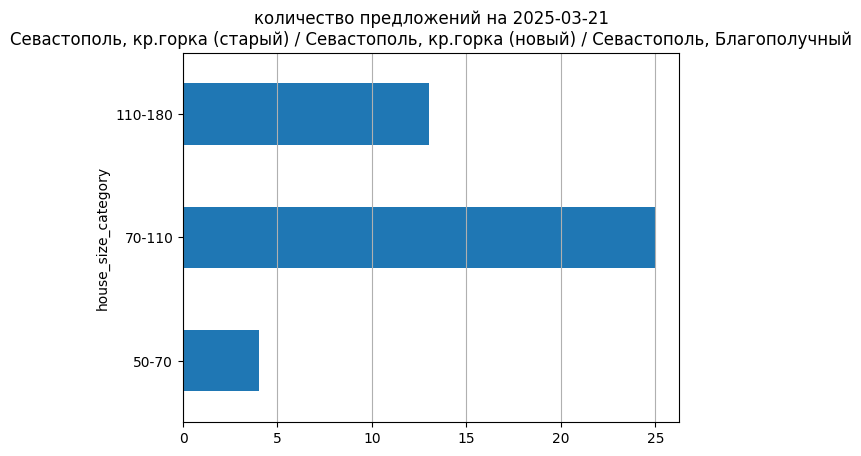

In [62]:
(
    gdf_last_local
    .drop_duplicates('url')
    .query('house_size_category in @sizes')
    .groupby(['house_size_category'], observed=True)['url'].count()
    .plot.barh(title='количество предложений на '+ str(dt_now) + '\n' + ' / '.join(area_name) )
    .grid(axis='x')    
)

In [63]:
sizes_ = ['70-110','110-180',] # '180-300' ]
# gdf_last_local.query('house_size_category in @sizes_')

In [64]:
# q_95 = gdf_last_local['priceM'].quantile(.95)

# # fig, ax = plt.subplots() #figsize=(7,3) )
# (
#     gdf_last_local
#     .query(f'(priceM<{q_95})')
#     .query('house_size_category in @sizes_')
#     #.groupby(['house_size_category'],observed=True)
#     .pivot(columns='house_size_category',values='priceM')
#     #['priceM']
#     #.count()
#     .plot.kde(
#         legend=True,
#         #ax=ax,
#         # title='/'.join(area_name), 
#         title=f'распределение цены на дома на '+ str( dt_now )+ '\n'+'/'.join(area_name), 
#         grid=True,
#         subplots=True,
#         layout=(2,2),
#         figsize=(11,6),
#         sharex=False
#     )   
# )
# #fig.suptitle(f'распределение цены на дома на '+ str( dt_now ), fontsize=16)
# #fig.tight_layout()

----

In [65]:
# изменение цены по району
gdf_local = gdf.sjoin( frame_, how='inner', predicate='within') 

In [66]:
stat = (
        gdf_local
        # .groupby(['house_size_category','month'],observed=True)
        .groupby(['house_size_category','week'],observed=True)
        ['priceM'].describe(percentiles=percentiles)
        .dropna()
    )
display( stat )

count  mean  std   min    1%    5%  \
house_size_category week                                                        
30-50               2024-06-03/2024-06-09   3.00  5.90 0.09  5.85  5.85  5.85   
                    2024-06-10/2024-06-16   3.00  5.85 0.15  5.70  5.70  5.71   
                    2024-06-17/2024-06-23   3.00  5.80 0.17  5.70  5.70  5.70   
                    2024-06-24/2024-06-30   3.00  5.80 0.17  5.70  5.70  5.70   
                    2024-07-08/2024-07-14   3.00  5.82 0.16  5.70  5.70  5.71   
...                                          ...   ...  ...   ...   ...   ...   
180-300             2024-09-02/2024-09-08   2.00 12.75 0.00 12.75 12.75 12.75   
                    2024-09-16/2024-09-22   2.00 11.38 1.94 10.00 10.03 10.14   
                    2024-10-14/2024-10-20   2.00 11.38 1.94 10.00 10.03 10.14   
                    2024-10-21/2024-10-27   2.00 11.38 1.94 10.00 10.03 10.14   
                    2024-10-28/2024-11-03   2.00 11.38 1.94 10.00 10.03 10.14   

                                            10%   25%   50%   75%   90%   95%  \
house_size_category week                                                        
30-50               2024-06-03/2024-06-09  5.85  5.85  5.85  5.92  5.97  5.99   
                    2024-06-10/2024-06-16  5.73  5.78  5.85  5.92  5.97  5.99   
                    2024-06-17/2024-06-23  5.70  5.70  5.70  5.85  5.94  5.97   
                    2024-06-24/2024-06-30  5.70  5.70  5.70  5.85  5.94  5.97   
                    2024-07-08/2024-07-14  5.71  5.72  5.75  5.88  5.95  5.97   
...                                         ...   ...   ...   ...   ...   ...   
180-300             2024-09-02/2024-09-08 12.75 12.75 12.75 12.75 12.75 12.75   
                    2024-09-16/2024-09-22 10.28 10.69 11.38 12.06 12.47 12.61   
                    2024-10-14/2024-10-20 10.28 10.69 11.38 12.06 12.47 12.61   
                    2024-10-21/2024-10-27 10.28 10.69 11.38 12.06 12.47 12.61   
                    2024-10-28/2024-11-03 10.28 10.69 11.38 12.06 12.47 12.61   

                                            max  
house_size_category week                         
30-50               2024-06-03/2024-06-09  6.00  
                    2024-06-10/2024-06-16  6.00  
                    2024-06-17/2024-06-23  6.00  
                    2024-06-24/2024-06-30  6.00  
                    2024-07-08/2024-07-14  6.00  
...                                         ...  
180-300             2024-09-02/2024-09-08 12.75  
                    2024-09-16/2024-09-22 12.75  
                    2024-10-14/2024-10-20 12.75  
                    2024-10-21/2024-10-27 12.75  
                    2024-10-28/2024-11-03 12.75  

[115 rows x 13 columns]

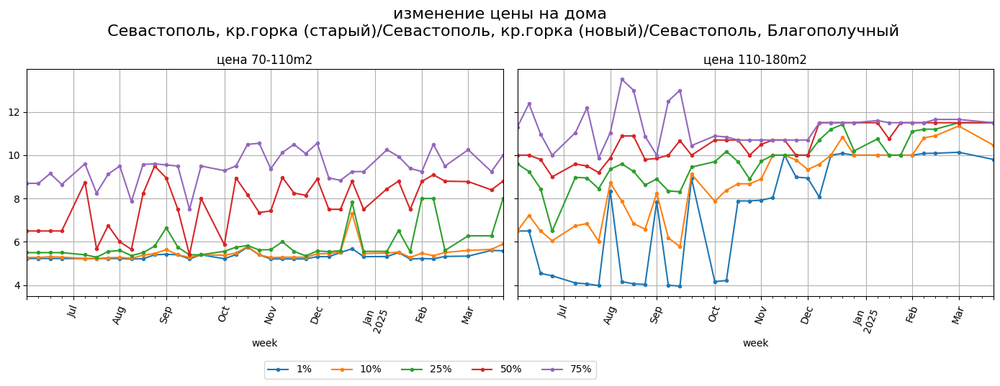

In [67]:
fig, ax = plt.subplots(1,len(sizes_),figsize=(14,5), sharey=True )

for i,s in enumerate(sizes_): 
    stat.loc[(s),cols].plot(title=f'цена {s}m2', grid=True,ax=ax[i],legend=False, rot=70, style='.-' )   

fig.suptitle(f'изменение цены на дома\n {'/'.join(area_name)}', fontsize=16)
fig.legend( labels=cols,frameon=True, ncol=len(cols), bbox_to_anchor=(0.6, 0.01))    
fig.tight_layout()

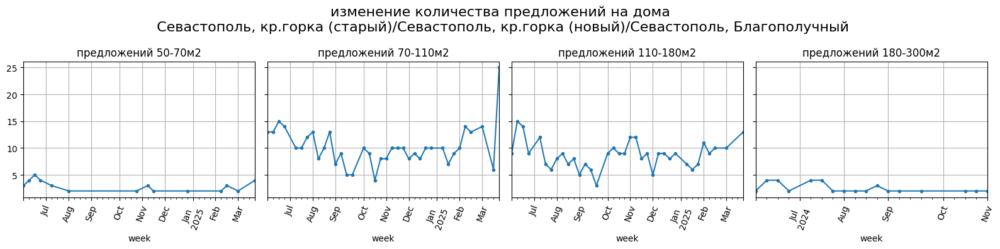

In [68]:
fig, ax = plt.subplots(1,len(sizes),figsize=(16,4), sharey=True )

for i,s in enumerate(sizes): 
    stat.loc[(s),'count'].plot(title=f'предложений {s}м2', grid=True,ax=ax[i],legend=False, rot=70, style='.-' )   

fig.suptitle(f'изменение количества предложений на дома\n {'/'.join(area_name)}', fontsize=16)

#fig.legend( labels=cols,frameon=True, ncol=len(cols), bbox_to_anchor=(0.6, 0.01))    
fig.tight_layout()